<hr style="height:.9px;border:none;color:#333;background-color:#333;" />


<h2>Coastal Resilience: leveraging Hurricane María's impact</h2>
<h4>DAT-5303 | Team 1</h4>

Francis Peñalosa  | Gustavo Giopato           | Hsiao-Yu Chen (Vivi)   
Kimberly Batin    | Olubukola Kolade Ogunniyi | Rebeca Canales 


<hr style="height:.9px;border:none;color:#333;background-color:#333;" />


Puerto Rico's mountainous terrain and tropical climate, with variable rainfall and a distinct hurricane season, are crucial factors in its vulnerability to climate change's impact, as noted by Britannica and Discover Puerto Rico. The Department of Natural and Environmental Resources emphasizes the critical need for specialized adaption techniques while acknowledging the increased hazards. The island's inability to prepare for disasters and its limited financial resources make it more difficult for it to respond and recover effectively.Puerto Rico saw a substantially delayed and less focused reaction from the federal government (Vick, 2017). The island experienced a long blackout, with some homes not getting electricity again until mid-August 2018. Furthermore, according to the US Army Corps of Engineers, many rural inhabitants had trouble getting to medical facilities immediately because of impassable mountain roads.

After Maria's damage to Puerto Rico, architects made sure to plan for the houses that can survive from hurricanes (Naditz, 2022). Many houses in Puerto Rico are now built from concrete because of the risk of hurricanes, while others are still built from wood and might not survive in disasters.Nonetheless, as highlighted by Santiago and Lamba (2022), there remains a critical shortage of affordable housing options for a significant portion of the population.

Marvel Architects responded to the aftermath of hurricanes Irma and Maria by spearheading efforts to empower vulnerable communities. In 2022, they introduced prototype homes engineered to withstand hurricanes and earthquakes. Equipped with solar panels for electricity generation and cisterns for rainwater harvesting and filtration, these homes represent a resilient solution to provide sustainable power and water access, as detailed by Peters (2022).

According to the research, less than 4% of the island's households are insured, signaling a shift in disaster risk management as private insurers are stepping in where the National Flood Insurance Program (NFIP) has been the traditional go-to. However, the reality in Puerto Rico is that 3.4 million residents live in informal or illegally constructed homes, which are not eligible for mandatory flood insurance, limiting their access to such protection. (Kousky & Lingle, 2018). 
<hr style="height:.9px;border:none;color:#333;background-color:#333;" />

<b> Actionable Insights </b>

1. The government should support families in accessing affordable, disaster-resistant housing through innovative solutions and financial assistance. Collaborations with developers like Marvel Architects and non-profit organizations are vital for building affordable homes. Ensuring robust community infrastructures, including shelters with reliable power and water supplies, is crucial for emergency accommodation. Local governments must mandate building updates to withstand severe weather events, enhancing community resilience

2. Improving disaster planning and response is crucial as Puerto Rico faces increasingly powerful hurricanes due to climate change. The government should prioritize landslide and flood forecasts, improve communication, and offer early notifications, drawing inspiration from Japan's comprehensive disaster education approach (Japan: Early Warning System Blueprint for Climate Adaptation Efforts | PreventionWeb, 2023). Collaborative planning with weather forecasters, emergency responders, and local leaders is key to engaging communities in safety preparations(Gavari-Starkie et al., 2021). Similar to Japan, where disaster preparedness is included into community events and school curriculum (Ministry of Foreign Affairs of Japan, 2020), residents should be well-informed about evacuation protocols, items to pack, and safety measures (Typhoons in Japan: What to Do Before, during and After, 2019). Similar educational initiatives, such as routine disaster response exercises and classes on disaster protection, might be implemented in Puerto Rico. 

3. Parametric insurance methods, based on specific hazard criteria like hurricane strength or earthquake magnitude, could swiftly close this gap, providing cost-effective insurance alternatives and faster recovery funding. By using cutting-edge technologies like machine learning and geospatial analysis to improve risk assessment and insurance modeling, insurance rates could be further adjusted to more closely match real risk profiles.Given housing and economic constraints, the government should explore ways to enhance insurance accessibility and uptake, crucial for long-term neighborhood recovery and resilience, alongside to providing post-disaster financial assistance.

<hr style="height:.9px;border:none;color:#333;background-color:#333;" />

Puerto Rico's journey through and after Hurricane Maria in 2017 offers valuable insights into how climate change can worsen natural disasters and how other parts of the world can prepare for similar threats. Puerto Rico's recovery and future resilience require a challenging approach, incorporating housing innovation, disaster preparedness, effective insurance models, and environmental conservation. These efforts need to be supported by strong community involvement and a responsive government enhancing disaster preparedness, and exploring innovative solutions. This approach is not only significant for Puerto Rico's continued recovery but also for the global effort to adapt to a changing climate and its associated risks. Collaboration between government, communities, and the private sector is necessary to ensure the well-being of Puerto Ricans.

<hr style="height:.9px;border:none;color:#333;background-color:#333;" />


<h2>Normalized Difference Vegetation Index Analysis</h2>

In [1]:
# supress warnings to keep the code clean
import warnings
warnings.filterwarnings('ignore')

# GeoTiff images
import rasterio
from   osgeo import gdal

# data visualisation
from   matplotlib        import pyplot as plt
from   matplotlib.pyplot import figure
import matplotlib.image  as img
from   PIL               import Image


# import GIS tools
import numpy                   as np
import xarray                  as xr
import matplotlib.pyplot       as plt
import rasterio.features
import rioxarray               as rio
from matplotlib.cm import RdYlGn, Reds

# import Planetary Computer tools
import pystac_client
import planetary_computer as pc
import odc
from odc.stac import stac_load

# additional libraries
from datetime import date # date-related calculations

# model building
import ultralytics
from   ultralytics import YOLO
import labelme2yolo

# others
import os
import shutil
import zipfile

<h3>Accessing Satellite Data</h3>

In [2]:
## Hurricane Maria - San Juan, Puerto Rico ##

# Defining the bounding box for the entire data region 
min_lon = -66.19385887
min_lat =  18.27306794
max_lon = -66.08007533
max_lat =  18.48024350


# setting geographic boundary
bounds = (min_lon, min_lat, max_lon, max_lat)


# setting time window
time_window = "2017-04-01/2018-04-30" #394 days to understand the hurricane's impact

# connecting to the planetary computer
stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")


# seaching for data
search = stac.search(collections = ["sentinel-2-l2a"],
                     bbox        = bounds,
                     datetime    = time_window)


# instantiating results list
items = list(search.get_all_items())


# results for the items matching the query
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 130


The following ODC-STAC code will load the selected items from the catalog search, select the desired spectral bands, including the 'qa_pixel' cloud filtering band, reproject into Lat-Lon coordinates (EPSG:4326) at 30-meters resolution (typical of Landsat pixel resolution), and clip the region to the spatial bounding box.

In [3]:
# pixel resolution for the final product
resolution = 10  # meters per pixel 


# scaling to degrees per pizel
scale = resolution / 111320.0 # degrees per pixel for CRS:4326 

xx = stac_load(
    items,
    bands      = ["red", "green", "blue", "nir", "SCL"],
    crs        = "EPSG:4326",                            # latitude-longitude
    resolution = scale,                                  # degrees
    chunks     = {"x": 2048, "y": 2048},
    dtype      = "uint16",
    patch_url  = pc.sign,
    bbox       = bounds
)

# viewing the dimensions of our XARRAY and the variables
display(xx)

<xarray.Dataset>
Dimensions:      (latitude: 2308, longitude: 1268, time: 67)
Coordinates:
  * latitude     (latitude) float64 18.48 18.48 18.48 ... 18.27 18.27 18.27
  * longitude    (longitude) float64 -66.19 -66.19 -66.19 ... -66.08 -66.08
    spatial_ref  int32 4326
  * time         (time) datetime64[ns] 2017-04-08T15:07:21.026000 ... 2018-04...
Data variables:
    red          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    green        (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    blue         (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    nir          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    SCL          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>

<h3>Viewing RGB images from the time series</h3>

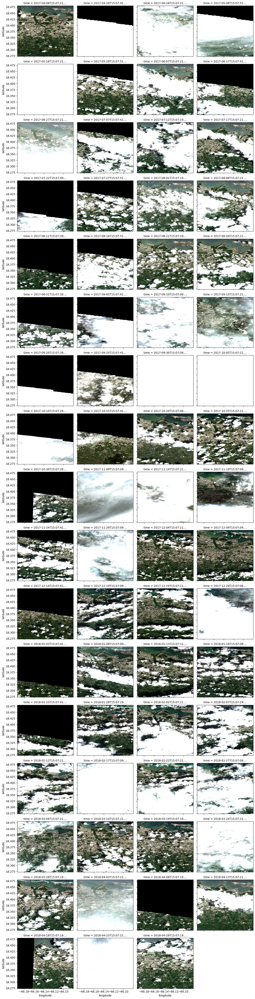

In [4]:
# subsetting results for RGB
plot_xx = xx[ ["red", "green", "blue"] ].to_array()


# showing results 
plot_xx.plot.imshow(col      = 'time', # time
                    col_wrap = 4     , # four columns per row
                    robust   = True  , 
                    vmin     = 0     ,
                    vmax     = 3000  )


# rendering results
plt.show()

Now, a time slice (image), is going to be selected  to view a single RGB image and the cloud mask. 

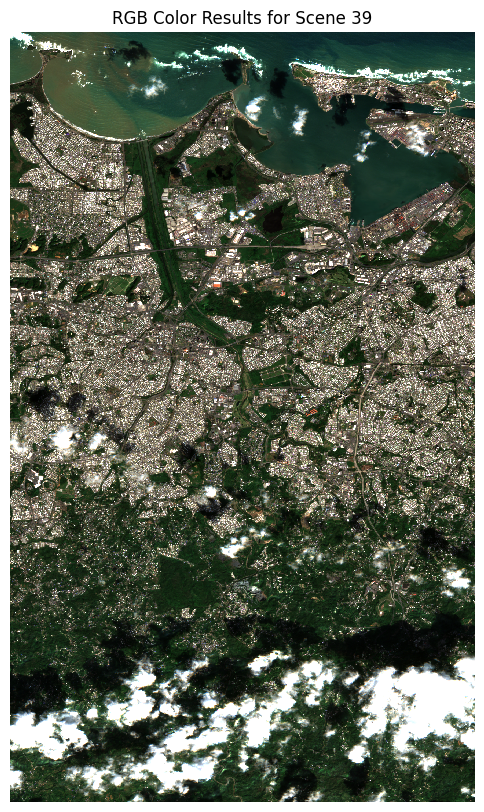

In [5]:
time_slice = 39 # December 4, 2017 (post-event)

## plotting an RGB real color image for a single date ##

# setting plot size
fig, ax = plt.subplots( figsize = (6, 10) )


# preparing the plot
xx.isel(time = time_slice)[ ["red", "green", "blue"] ].\
    to_array().plot.imshow(robust = True,
                           ax     = ax  ,
                           vmin   = 0   ,
                           vmax   = 3000)


# titles and axis lables
ax.set_title(label = f"RGB Color Results for Scene {time_slice}")
ax.axis('off')


# rendering results
plt.show()

<h3>Applying Cloud Filtering and Masking</h3>

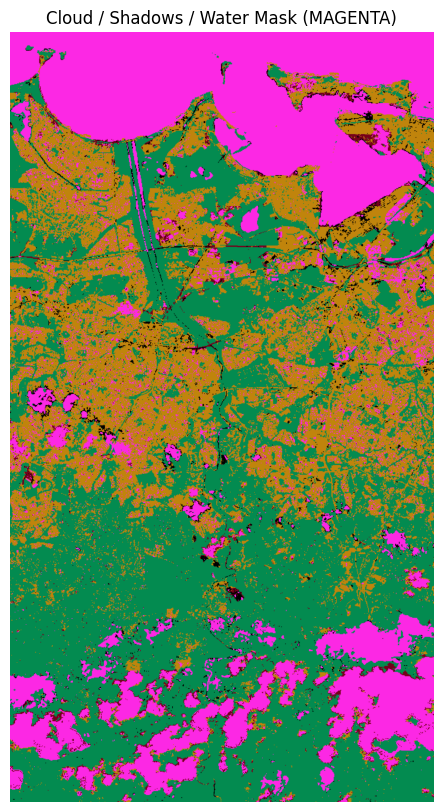

In [6]:
# Colormap for SCL pixel classifications

scl_colormap = np.array(
    [
        [252,  40, 228, 255],  # 0  - NODATA - MAGENTA
        [255,   0,   4, 255],  # 1  - Saturated or Defective - RED
        [0  ,   0,   0, 255],  # 2  - Dark Areas - BLACK
        [97 ,  97,  97, 255],  # 3  - Cloud Shadow - DARK GREY
        [3  , 139,  80, 255],  # 4  - Vegetation - GREEN
        [192, 132,  12, 255],  # 5  - Bare Ground - BROWN
        [21 , 103, 141, 255],  # 6  - Water - BLUE
        [117,   0,  27, 255],  # 7  - Unclassified - MAROON
        [208, 208, 208, 255],  # 8  - Cloud - LIGHT GREY
        [244, 244, 244, 255],  # 9  - Definitely Cloud - WHITE
        [195, 231, 240, 255],  # 10 - Thin Cloud - LIGHT BLUE
        [222, 157, 204, 255],  # 11 - Snow or Ice - PINK
    ],
    dtype="uint8",
)

# Function for color encoding
def colorize(xx, colormap):
    return xr.DataArray( colormap[xx.data],
                         coords = xx.coords,
                         dims   = (*xx.dims, "band") )

# filtering out water, etc.
filter_values = [0, 1, 3, 6, 8, 9, 10]

cloud_mask = ~xx.SCL.isin(filter_values) # this means not in filter_values

# appling cloud mask (filtering out clouds, cloud shadows, and water)

# storing as 16-bit integers
cleaned_data = xx.where(cloud_mask).astype("uint16")

# converting SCL to RGB
scl_rgba_clean = colorize(xx       = cleaned_data.isel(time = time_slice).SCL.compute(), 
                          colormap = scl_colormap)


# setting figure size
plt.figure(figsize = (6, 10))
plt.imshow(scl_rgba_clean)


# titles and axis labels
plt.title(label = "Cloud / Shadows / Water Mask (MAGENTA)")
plt.axis('off')


# rendering the plot
plt.show()

<h2> Pre- and Post-Event NDVI </h2>

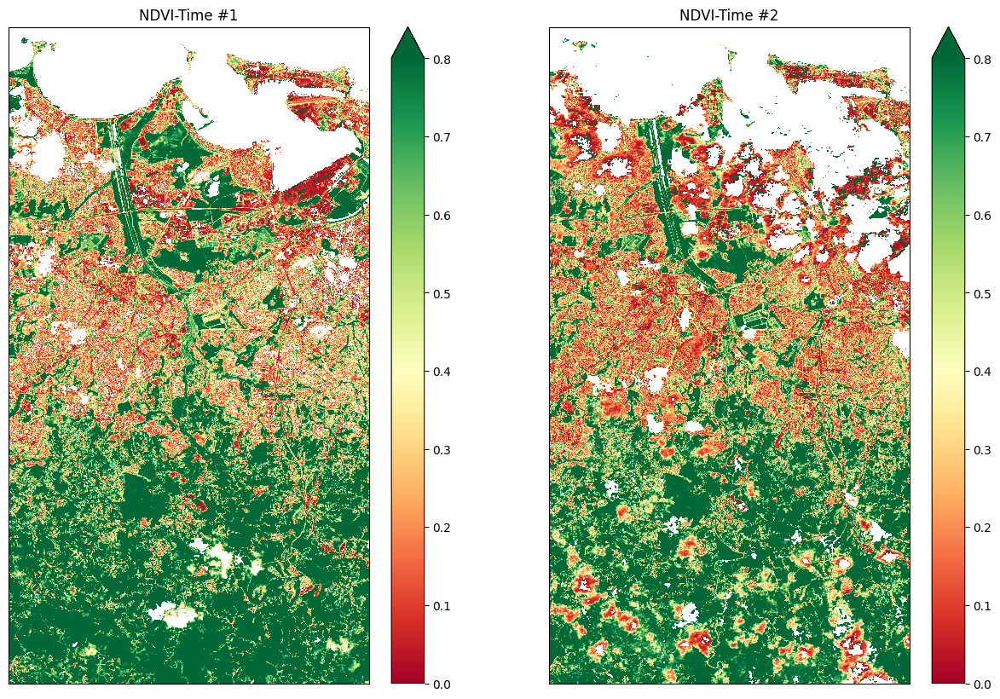

In [7]:
# preparing 4 time steps to compare NDVI outputs in different time slices
first_time  = 0  # April 8, 2017        Before the event 
second_time = 38 # December 4, 2017     After the event 
third_time= 39   # December 9, 2017     After the event 
forth_time = 66  # April 28, 2018       After the event 

# Plots of NDVI at two different time slices (pre & post event)
# Clouds, Shadows and Water are masked

# setting figure size
fig, ax = plt.subplots(1, 2, figsize = (15, 10))


# first image data
ndvi_image = (cleaned_data.nir - cleaned_data.red) / (cleaned_data.nir + cleaned_data.red)
ndvi_image.isel(time = first_time ).plot(ax = ax[0],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# second image data
ndvi_image.isel(time = second_time).plot(ax = ax[1],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# axis labels
ax[0].set_title(label = 'NDVI-Time #1'), ax[0].xaxis.set_visible(False), ax[0].yaxis.set_visible(False)
ax[1].set_title(label = 'NDVI-Time #2'), ax[1].xaxis.set_visible(False), ax[1].yaxis.set_visible(False)


# rendering the plot
plt.show()

The NDVI-Time #1 (left) serves as the baseline for vegetation health prior to the hurricane. Therefore, the green indicates areas with healthy vegetation, and the presence of red/orange areas could be due to urban structures, bare soil, or stressed vegetation considering that there was a hurricane two weeks before María. 

Shortly after the hurricane (77 days after), NDVI-Time #2 (right) show almost immediate (because there is not clear image prior) effects. The changes from green to more orange or red hues in certain areas could reflect this damage.

- **General Vegetation Health**: Both images show green shades, indicating generally healthy vegetation across most of the area. However, there are patches of red and orange, suggesting areas of stressed vegetation or non-vegetative surfaces.

- **Water Bodies and Non-vegetated Areas**: White and deep red areas likely represent bodies of water or really poor land, respectively. These appear consistent at the top between the two time points, suggesting no significant changes in water levels. However, the deepen of red shades on the center part and the appearance on the bottom indicate an decrease of vegetation. 


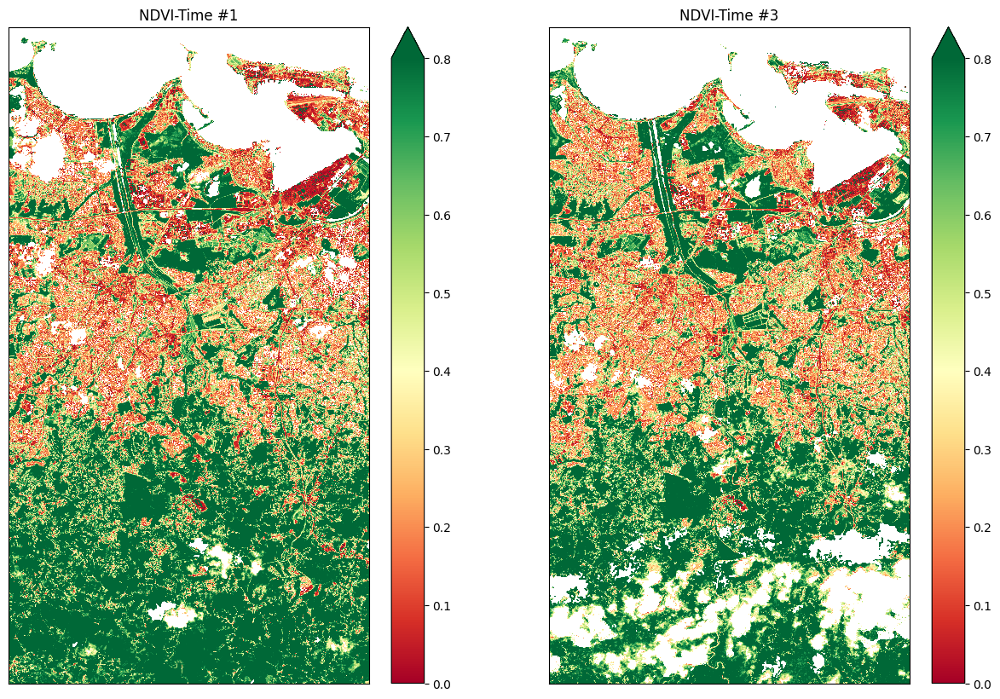

In [8]:
# Plots of NDVI at two different time slices using the third_image 
# Clouds, Shadows and Water are masked (whites)

# setting figure size
fig, ax = plt.subplots(1, 2, figsize = (15, 10))


# first image data
ndvi_image_2 = (cleaned_data.nir - cleaned_data.red) / (cleaned_data.nir + cleaned_data.red)
ndvi_image_2.isel(time = first_time ).plot(ax = ax[0],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# third image data
ndvi_image_2.isel(time = third_time).plot(ax = ax[1],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# axis labels
ax[0].set_title(label = 'NDVI-Time #1'), ax[0].xaxis.set_visible(False), ax[0].yaxis.set_visible(False)
ax[1].set_title(label = 'NDVI-Time #3'), ax[1].xaxis.set_visible(False), ax[1].yaxis.set_visible(False)


# rendering the plot
plt.show()

Picture one is the baseline so now we are using NDVI-Time #3 (right, 88 days after the event) which it show signs of recovery in vegetation health. With a week between NDVI-Time #2 and #3, we can see that vegetation can respond quickly to environmental factors like rain and time (to heal).

- **Seasonal Variation**: There seems to be a similar distribution of vegetation health as Time #2. Any changes in color intensity would again point to seasonal variation or short-term environmental impact like sunlight and light rain.

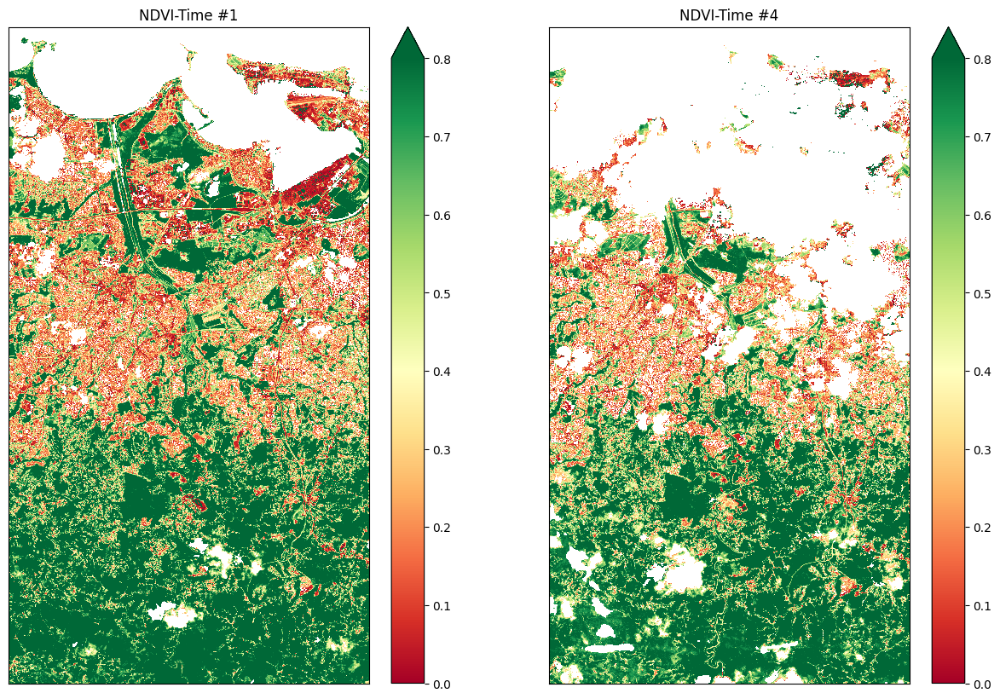

In [9]:
# Plots of NDVI at two different time slices using the forth image
# Clouds, Shadows and Water are masked

# setting figure size
fig, ax = plt.subplots(1, 2, figsize = (15, 10))


# first image data
ndvi_image_3 = (cleaned_data.nir - cleaned_data.red) / (cleaned_data.nir + cleaned_data.red)
ndvi_image_3.isel(time = first_time ).plot(ax = ax[0],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# second image data
ndvi_image_3.isel(time = forth_time).plot(ax = ax[1],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# axis labels
ax[0].set_title(label = 'NDVI-Time #1'), ax[0].xaxis.set_visible(False), ax[0].yaxis.set_visible(False)
ax[1].set_title(label = 'NDVI-Time #4'), ax[1].xaxis.set_visible(False), ax[1].yaxis.set_visible(False)


# rendering the plot
plt.show()

The, NDVI-Time #4 (right) show the longer-term impacts of the hurricane on vegetation, focusing on the bottom and central area since the top is water and urban area. Persistent red and orange areas like in the bottom right, indicate areas where vegetation was severely damaged and has not recovered. While in the bottom left, green areas have expanded compared to the earlier post-hurricane images (NDVI-Time #2 and #3), which indicates regrowth and recovery over time.

**Key points**
- **Immediate Impact**: A reduction in green areas in NDVI-Time #2 compared to NDVI-Time #1 would be expected due to vegetation loss from high winds and flooding.

- **Vegetation Recovery**: An increase in green areas in NDVI-Time #3 indicate regrowth or recovery of vegetation.

- **Permanent Changes**: In further analysis, if certain areas remain red or orange on the bottom or closer to the center of the picture, it might suggest permanent changes to the landscape, such as land becoming waterlogged or erosion removing topsoil, preventing vegetation from recovering.

<h3> Anomaly NDVI Analysis </h3>

In [10]:
# function for calculating NDVI anomalies
def NDVI(dataset):
    return (dataset.nir - dataset.red) / (dataset.nir + dataset.red)

# running comparison
ndvi_clean = NDVI(cleaned_data)

# calculating difference #1 vs #2
ndvi_pre     = ndvi_clean.isel(time = first_time)
ndvi_post    = ndvi_clean.isel(time = second_time)
ndvi_anomaly = ndvi_post - ndvi_pre

# calculating difference #1 vs #3
ndvi_pre     = ndvi_clean.isel(time = first_time)
ndvi_post_2    = ndvi_clean.isel(time = third_time)
ndvi_anomaly_2 = ndvi_post_2 - ndvi_pre

# calculating difference #1 vs #3
ndvi_pre     = ndvi_clean.isel(time = first_time)
ndvi_post_3    = ndvi_clean.isel(time = forth_time)
ndvi_anomaly_3 = ndvi_post_3 - ndvi_pre


# all areas of water or clouds will be black
RdYlGn.set_bad('black',1.)


# reversing the colormap for reds
Reds_reverse = "Reds_r"

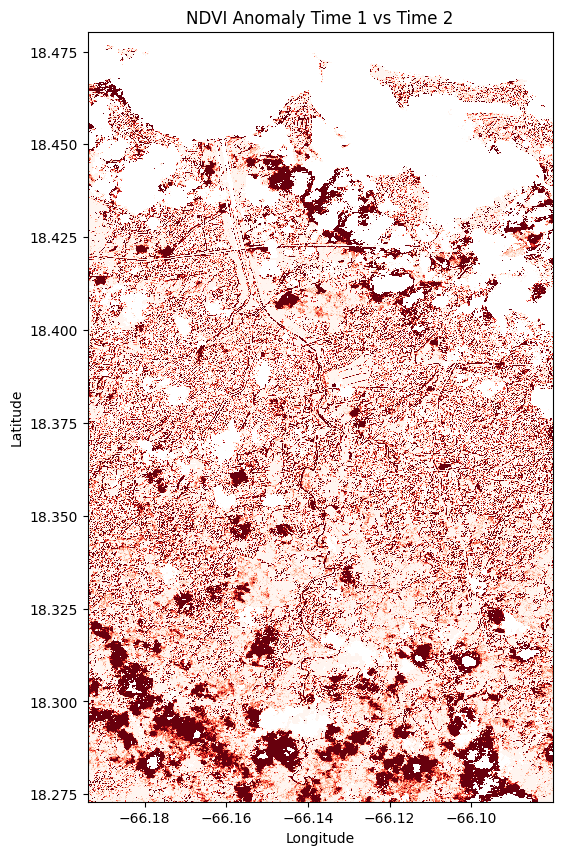

In [11]:
## plotting NDVI anomaly
plt.figure( figsize = (6,10) )
ndvi_anomaly.plot(vmin = -0.2, 
                  vmax=0.0, 
                  cmap = Reds_reverse, 
                  add_colorbar=False)


# titles and labels
plt.title (label  = "NDVI Anomaly Time 1 vs Time 2")
plt.xlabel(xlabel = "Longitude")
plt.ylabel(ylabel = "Latitude")


# rendering the plot
plt.show()

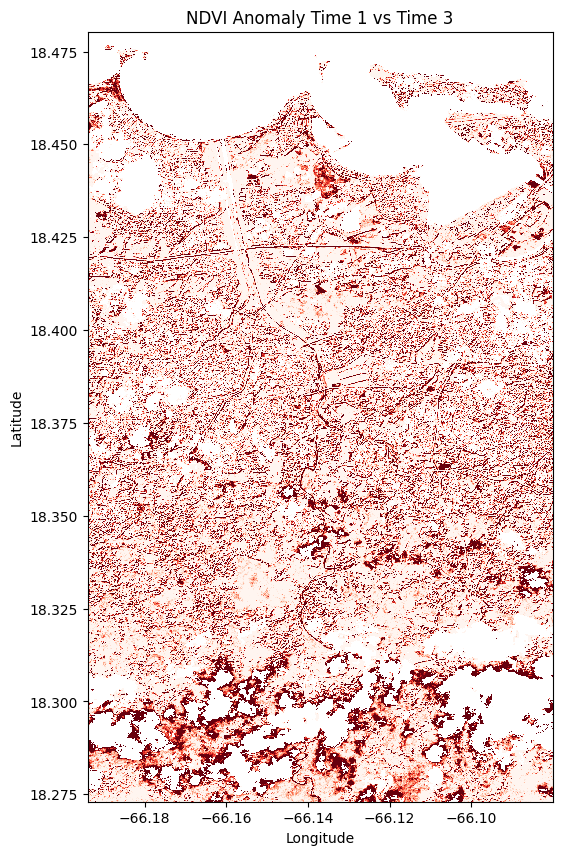

In [12]:
# Plotting Anomaly 2
plt.figure( figsize = (6,10) )
ndvi_anomaly_2.plot(vmin = -0.2, 
                    vmax=0.0, 
                    cmap = Reds_reverse, 
                    add_colorbar=False)


# titles and labels
plt.title (label  = "NDVI Anomaly Time 1 vs Time 3")
plt.xlabel(xlabel = "Longitude")
plt.ylabel(ylabel = "Latitude")


# rendering the plot
plt.show()

The NDVI anomaly images are a comparison between the baseline (pre-event) vegetation index and the post-event conditions at different times. An NDVI anomaly image typically highlights the difference between the NDVI values at two different times, indicating areas where the vegetation index has increased or decreased.

- **Time 1 vs. Time 2**: The first anomaly image shows the almost immediate (because there is not clear image prior) difference in NDVI values after the hurricane María. Darker areas indicate a greater negative anomaly (a decrease in NDVI value), which means vegetation loss, or  vegetation damage caused by the hurricane.
- **Time 1 vs. Time 3**: The second anomaly image seems to indicate a slightly different pattern of change. This reflects changes in the recovery since Time 2. It is important to note how some areas may have begun recovering, while others remain negatively affected. However, since the image has presence of clouds, a 4th image was required to asses this possible damage.

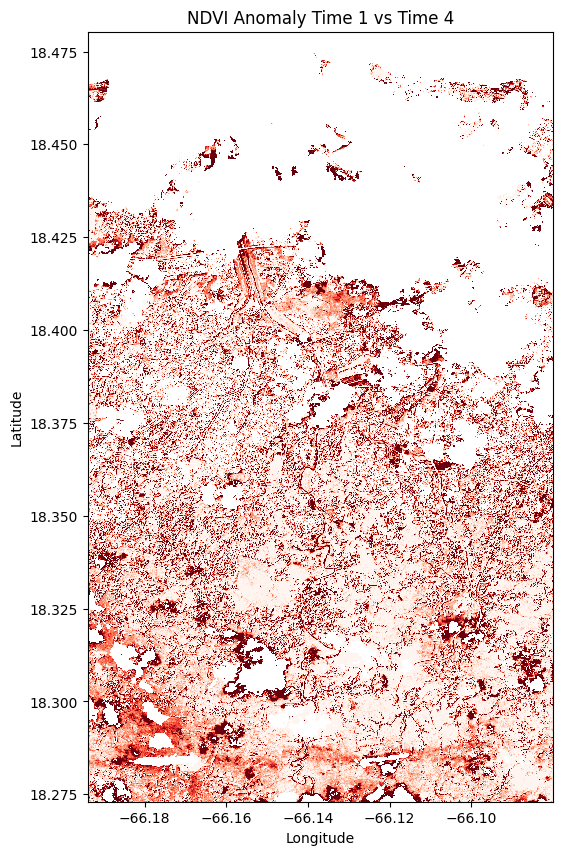

In [13]:
#Plotting Anomaly 3
plt.figure( figsize = (6,10) )
ndvi_anomaly_3.plot(vmin = -0.2, vmax=0.0, cmap = Reds_reverse, add_colorbar=False)


# titles and labels
plt.title (label  = "NDVI Anomaly Time 1 vs Time 4")
plt.xlabel(xlabel = "Longitude")
plt.ylabel(ylabel = "Latitude")


# rendering the plot
plt.show()

-**Time 1 vs. Time 4**: The third anomaly image shows a comparison with a later stage, indicating areas where vegetation has recovered. Nonetheless, there has been further decline in NDVI values due to continued stress on the vegetation or complete loss of vegetation. 

### **Factors Influencing NDVI Changes:**
These are some factors to further understand the complexity of the impact of hurricanes on vegetation: 

1. **Wind Damage**: Strong hurricane winds can defoliate trees and significantly damage crops, which leads to a lower NDVI reading.
2. **Flooding**: long period of floodings can kill plants or stress vegetation, which would also be reflected in lower NDVI values.
3. **Saltwater Intrusion**: In coastal areas, hurricanes can cause saltwater intrusion, which can have long-term effects on vegetation health.
4. **Human Intervention**: Post-hurricane recovery efforts, including cleanup, replanting, or land use changes, can affect NDVI readings depending on the activity. For example, replanting can increase green areas while land use change can increase red zones. 

<h2>Model Building</h2>
<h3>Importing the Data</h3>

In [17]:
# Paths to event images
pre_event_image = '/Users/bex/Desktop/T1_BCIII/Baseline_Images/Pre_Event_San_Juan.tif'
post_event_image ='/Users/bex/Desktop/T1_BCIII/Baseline_Images/Post_Event_San_Juan.tif'

<h3>Data Preprocessing</h3>

In [18]:
def generate_tiles(input_file, output_dir, grid_x, grid_y):
    ds = gdal.Open(input_file)

    # get image size and number of bands
    width = ds.RasterXSize
    height = ds.RasterYSize
    num_bands = ds.RasterCount

    # calculate number of tiles in each dimension
    num_tiles_x = (width // grid_x)
    num_tiles_y = (height // grid_y)

    print(f"Total number of tiles: {num_tiles_x * num_tiles_y}")

    # create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # iterate over each tile and save as a separate TIFF image
    for i in range(num_tiles_x):
        for j in range(num_tiles_y):
            x_offset = i *  grid_x
            y_offset = j *  grid_y

            tile_width = min(grid_x, width - x_offset)
            tile_height = min(grid_y, height - y_offset)

            tile = []
            for band in range(1, num_bands + 1):
                tile_data = ds.GetRasterBand(band).ReadAsArray(x_offset, y_offset, tile_width, tile_height)
                tile.append(tile_data)

            # create output filename
            output_file = os.path.join(output_dir, f"tile_{i}_{j}.tif")
                
            # create an output TIFF file with same CRS and band values range
            driver = gdal.GetDriverByName("GTiff")
            options = ['COMPRESS=DEFLATE', 'PREDICTOR=2', 'TILED=YES']
            out_ds = driver.Create(output_file, tile_width, tile_height, num_bands, 
                       ds.GetRasterBand(1).DataType, options=options)
            # out_ds = driver.Create(output_file, tile_width, tile_height, num_bands, ds.GetRasterBand(1).DataType)

            # set the geotransform
            geotransform = list(ds.GetGeoTransform())
            geotransform[0] = geotransform[0] + x_offset * geotransform[1]
            geotransform[3] = geotransform[3] + y_offset * geotransform[5]
            out_ds.SetGeoTransform(tuple(geotransform))

            # set the projection
            out_ds.SetProjection(ds.GetProjection())

            # write each band to the output file
            for band in range(1, num_bands + 1):
                out_band = out_ds.GetRasterBand(band)
                out_band.WriteArray(tile[band - 1])

            # close the output file
            out_ds = None

    print("Tiles generation completed.")

In [21]:
# Input and output files
input_file = "/Users/bex/Desktop/T1_BCIII/Baseline_Images/Pre_Event_San_Juan.tif"
output_dir = "/Users/bex/Desktop/T1_BCIII/Baseline_Images/Pre_Event_Grids_In_TIFF"

# Setting grid size
grid_x = 512
grid_y = 512
generate_tiles(input_file, output_dir, grid_x, grid_y)

Total number of tiles: 10730
Tiles generation completed.


In [25]:
# Converting Images to .png/.jpg images
def convert_tiff_to_jpeg(input_dir,output_dir):
    # check if output_dir exists, if not create it
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(input_dir):
        # check if file is an image (ends with .tif)
        if filename.endswith('.tif'):
            img = Image.open(os.path.join(input_dir, filename))
        
            # check if image is RGB mode, if not convert it
            if img.mode != 'RGB':
                img = img.convert('RGB')
        
            # create new filename, replace .tif with .jpg
            output_filename = os.path.splitext(filename)[0] + '.jpg'
        
            # save the image in JPEG format
            img.save(os.path.join(output_dir, output_filename), 'JPEG')
    print("Conversion from TIFF to JPEG completed.")

In [24]:
# data visualisation
from   matplotlib        import pyplot as plt
from   matplotlib.pyplot import figure
import matplotlib.image  as img
from   PIL               import Image


In [26]:
# Specifying directory
input_dir = "./Baseline_Images/Pre_Event_Grids_In_TIFF"
output_dir = "./Pre_Event_Grids_In_JPEG"
convert_tiff_to_jpeg(input_dir,output_dir)

Conversion from TIFF to JPEG completed.


In [28]:
# Renaming the Files
def rename_files(directory_path):
# define the directory path where your files are located
    directory_path = directory_path
    
    # getting a list of all files in the directory
    files = os.listdir(directory_path)
    
    # define a prefix for the new file names 
    # change the prefix as per requirement
    prefix = "Pre_Event_"
    
    # start the numbering from 1
    number = 0
    
    # loop through each file in the directory
    for filename in files:
        # Check if the item is a file (not a directory)
        if os.path.isfile(os.path.join(directory_path, filename)):
            # Get the file extension
            file_extension = os.path.splitext(filename)[1]
    
            # Create the new file name with leading zeros
            new_filename = f"{prefix}{number:03}{file_extension}"
    
            # Construct the full path to the original and new files
            old_filepath = os.path.join(directory_path, filename)
            new_filepath = os.path.join(directory_path, new_filename)
    
            # Rename the file
            os.rename(old_filepath, new_filepath)
    
            # Increment the number for the next file
            number += 1
    
    print("Files renamed successfully.")

In [29]:
# Applying rename_files
rename_files(output_dir)

Files renamed successfully.


<h2>Object Detection (Image Labeling)</h2>
<h3>Generating Training and Testing Data along with the Configuration File</h3>

In [35]:
#!labelme2yolo --json_dir /path/to/labelme_json_dir/
!labelme2yolo --json_dir "/Users/bex/Desktop/LabelMe" 


python(47244) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


INFO:labelme2yolo:Searching label list from json files ...
INFO:labelme2yolo:Converting train set ...
Converting... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00m 0:00:01
INFO:labelme2yolo:Converting val set ...
Converting... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00m 0:00:01
INFO:labelme2yolo:Converting test set ...
Converting... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   0% -:--:--


<h2>Model Building</h2>

In [36]:
#Loading the model
model = YOLO('yolov8n.pt')
# Display model information (optional)
model.info()

YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs


(225, 3157200, 0, 8.8575488)

<h3>Labelme Model</h3>

In [39]:
# Train the model on the dataset for 50 epochs
results = model.train(data   = '/Users/bex/Desktop/LabelMe/YOLODataset/dataset.yaml', 
                      epochs =  50 ,
                      imgsz  = 512)

New https://pypi.org/project/ultralytics/8.2.4 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.0 🚀 Python-3.11.5 torch-2.2.2 CPU (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/bex/Desktop/LabelMe/YOLODataset/dataset.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

python(47357) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Model summary: 225 layers, 3011628 parameters, 3011612 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /Users/bex/Desktop/LabelMe/YOLODataset/labels/train... 83 images

train: New cache created: /Users/bex/Desktop/LabelMe/YOLODataset/labels/train.cache



val: Scanning /Users/bex/Desktop/LabelMe/YOLODataset/labels/val... 21 images, 0 

val: New cache created: /Users/bex/Desktop/LabelMe/YOLODataset/labels/val.cache
Plotting labels to runs/detect/train5/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to runs/detect/train5
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      2.062      4.141      1.762        125        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334    0.00331      0.181     0.0143    0.00434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50         0G      1.864      4.015      1.597         96        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334    0.00398      0.195     0.0388     0.0143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       3/50         0G      1.724      3.637      1.424         54        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334    0.00533       0.19     0.0632     0.0233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/50         0G      1.703      3.177      1.375        109        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334    0.00447      0.181     0.0314     0.0141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/50         0G      1.742      2.751      1.405         83        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334     0.0113       0.24     0.0593     0.0247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/50         0G       1.68      2.651      1.352         42        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334     0.0135      0.275     0.0653     0.0319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/50         0G      1.735      2.498      1.368         26        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.859      0.115      0.186     0.0832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/50         0G      1.638      2.292      1.307         49        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.232      0.227      0.219      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/50         0G      1.625      2.139      1.318         53        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.266      0.348      0.239       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/50         0G      1.535      2.229      1.273          9        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.209      0.393      0.232      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      11/50         0G      1.656       2.02      1.335         52        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.191      0.478      0.255      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      12/50         0G      1.613      2.052      1.303        114        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.192      0.547      0.266       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      13/50         0G      1.559      1.903      1.294         37        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334       0.21       0.49      0.275      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      14/50         0G      1.613      1.874      1.328         53        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.243      0.377      0.278      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      15/50         0G      1.589      1.787      1.308         61        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.248      0.365      0.264      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      16/50         0G       1.63       1.75      1.277         65        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.194      0.414      0.213      0.104

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      17/50         0G      1.527      1.849      1.306         71        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.178      0.379      0.181     0.0827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      18/50         0G       1.53      1.884      1.324         30        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334       0.18       0.41      0.199     0.0882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      19/50         0G      1.568      1.692      1.346         27        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.196      0.432      0.209     0.0944

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      20/50         0G      1.546      1.721      1.282         53        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334       0.26      0.451       0.23      0.108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      21/50         0G      1.507      1.739      1.228         42        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.229      0.475      0.219      0.103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      22/50         0G      1.505      1.691      1.249         38        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.207      0.498      0.264      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      23/50         0G      1.469      1.844      1.231         15        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.209      0.507      0.287      0.143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      24/50         0G      1.512      1.646      1.243         67        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334        0.2      0.441      0.289      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      25/50         0G      1.442      1.692      1.275         78        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.209       0.45      0.275      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      26/50         0G      1.463      1.675      1.228         56        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.172      0.497       0.22       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      27/50         0G      1.478       1.59      1.256         90        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.203      0.541      0.227      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      28/50         0G      1.425      1.592      1.234        114        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.201      0.541      0.261      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      29/50         0G      1.459      1.566      1.273         56        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.206      0.533      0.291      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      30/50         0G      1.423      1.611       1.23         27        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.245      0.512      0.341      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      31/50         0G      1.437      1.626      1.215         32        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.258      0.506       0.37      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      32/50         0G      1.433      1.461      1.198         69        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.278       0.43      0.368      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      33/50         0G      1.475      1.619      1.259         49        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.276      0.454      0.346       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      34/50         0G      1.425      1.507      1.227         41        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.284      0.482      0.326      0.174

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      35/50         0G      1.387      1.407      1.189         90        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.322      0.446      0.343      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      36/50         0G      1.396       1.42      1.202         91        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.327      0.472      0.363      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      37/50         0G      1.415       1.43      1.196         80        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.339      0.502      0.387      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      38/50         0G      1.408       1.47      1.201        147        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.333      0.505      0.384      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      39/50         0G      1.381      1.475      1.228         36        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.336      0.556      0.398      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      40/50         0G      1.346      1.387      1.204         51        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334       0.36      0.557      0.395      0.215
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      41/50         0G      1.329        1.5      1.223         44        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.348      0.568      0.377      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      42/50         0G      1.397      1.493      1.215         73        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.314       0.58      0.367      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      43/50         0G      1.282      1.423      1.168         18        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.311      0.558      0.365      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      44/50         0G      1.312       1.43       1.17         56        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.282      0.515      0.344      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      45/50         0G       1.31      1.542      1.157         11        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.283        0.5      0.345       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      46/50         0G      1.394      1.553      1.226         33        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.286       0.49      0.353       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      47/50         0G      1.248      1.462      1.194         13        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.302      0.482      0.358      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      48/50         0G      1.349      1.429      1.267         30        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.287      0.596      0.367      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      49/50         0G       1.29      1.363      1.214         30        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.286      0.588      0.379      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      50/50         0G      1.342      1.438        1.2         60        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         21        334      0.337      0.451      0.391      0.212

50 epochs completed in 0.416 hours.


Optimizer stripped from runs/detect/train5/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 6.2MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics YOLOv8.2.0 🚀 Python-3.11.5 torch-2.2.2 CPU (Apple M2 Pro)


python(47435) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all         21        334      0.358       0.56      0.397      0.216
undamagedresidentialbuilding         21        197      0.485      0.541      0.512      0.256
damagedcommercialbuilding         21         15      0.116      0.467      0.187     0.0799
undamagedcommercialbuilding         21         26      0.128      0.731      0.289      0.188
damagedresidentialbuilding         21         96      0.702        0.5      0.598       0.34
Speed: 1.0ms preprocess, 142.1ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/train5


<h3>Roboflow Model</h3>

In [32]:
# Train the model on the dataset for 50 epochs
results = model.train(data   = '/Users/bex/Desktop/T1_BCIII/roboflow/data.yaml',
                      epochs =  50 ,
                      imgsz  = 512)

New https://pypi.org/project/ultralytics/8.2.3 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.0 🚀 Python-3.11.5 torch-2.2.2 CPU (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/bex/Desktop/T1_BCIII/roboflow/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save

python(37260) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(37265) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

python(37266) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Model summary: 225 layers, 3011628 parameters, 3011612 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /Users/bex/Desktop/T1_BCIII/roboflow/labels/train... 5516 images


train: New cache created: /Users/bex/Desktop/T1_BCIII/roboflow/labels/train.cache


val: Scanning /Users/bex/Desktop/T1_BCIII/roboflow/labels/val... 1413 images, 0 

val: New cache created: /Users/bex/Desktop/T1_BCIII/roboflow/labels/val.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.217      1.901       1.17        360        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.419      0.558      0.468      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.005      1.214      1.058        356        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.502      0.577       0.55      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G     0.9829      1.149      1.049        257        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.468      0.538      0.494      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G     0.9469      1.089      1.035        314        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.566      0.598      0.619      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G     0.9246      1.061      1.031        335        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.548      0.614      0.605      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G     0.9106      1.029      1.024        416        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.599       0.65      0.676      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G     0.9046      1.007      1.021        331        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.621      0.662      0.689      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G     0.8861     0.9912      1.013        346        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.622      0.655      0.683      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G     0.8741     0.9674      1.011        390        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.595      0.663      0.679      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G     0.8706     0.9523      1.007        414        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.528      0.637      0.641      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G     0.8612     0.9433      1.005        467        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.594      0.644      0.682      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      0.857     0.9362      1.002        324        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.637      0.675      0.716      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G     0.8455     0.9256      0.999        263        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227       0.63      0.672      0.715      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G     0.8404     0.9148     0.9954        406        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.623      0.669      0.693      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G     0.8374     0.9071     0.9933        409        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.632      0.682      0.701      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G     0.8372     0.8996     0.9929        498        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.655      0.701      0.741      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G     0.8305     0.8931      0.992        602        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.658      0.691      0.734      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G     0.8255     0.8947     0.9906        477        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.646      0.678      0.716      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G     0.8226     0.8846     0.9889        338        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.644      0.678      0.721      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      0.819     0.8778     0.9883        534        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.635      0.696      0.715      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G      0.818     0.8713     0.9864        300        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.632      0.693      0.713      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G     0.8108     0.8609     0.9841        370        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.647        0.7      0.726      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G     0.8073     0.8545     0.9814        306        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.656      0.705      0.739      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G     0.8007     0.8437      0.979        258        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.655      0.697      0.731       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G     0.8029     0.8498     0.9779        399        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.652      0.704      0.737      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      0.798     0.8421     0.9812        465        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.673      0.709      0.757      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G     0.7957     0.8402     0.9779        399        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.676      0.687       0.74      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      0.792     0.8366      0.977        268        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.658      0.705      0.738      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G     0.7903     0.8317     0.9761        217        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.671      0.706      0.753      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G     0.7893     0.8241     0.9768        262        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.669      0.711      0.751      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G     0.7837     0.8195     0.9716        324        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227       0.68       0.72      0.761      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G     0.7815     0.8136     0.9713        288        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.675      0.727      0.758      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G     0.7774     0.8155     0.9714        365        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.693      0.708      0.763      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G     0.7768     0.8081     0.9702        375        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.684      0.714      0.762      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G       0.77     0.7986     0.9684        541        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.678      0.712       0.76      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G     0.7677     0.7955     0.9671        400        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.692      0.723       0.77       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G     0.7693     0.7973     0.9671        438        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.702      0.719      0.773      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      0.764     0.7878     0.9655        498        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.682      0.717      0.764      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G     0.7654     0.7888     0.9632        442        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.691       0.72      0.769      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G     0.7607     0.7832     0.9641        452        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.695      0.726      0.776       0.63


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G     0.7113     0.7503     0.9495        235        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227       0.69      0.712      0.769      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      0.704      0.735     0.9474        277        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.704      0.707       0.77      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G     0.6951      0.728     0.9455        237        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.713      0.717      0.785       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G     0.6954     0.7235     0.9441        142        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.708      0.722      0.778      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G     0.6901     0.7164     0.9408        196        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.707      0.726      0.783      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G     0.6889     0.7114     0.9407        171        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.693      0.726      0.774      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G     0.6839     0.7013     0.9402        234        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.699      0.731      0.782      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G     0.6842     0.7023     0.9386        204        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.708      0.721      0.781      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G     0.6767     0.6968     0.9367        231        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.709      0.724      0.783       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G     0.6793      0.694     0.9385        197        512: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       1413      32227      0.718      0.726      0.789      0.645



50 epochs completed in 25.450 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...


python(43606) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Ultralytics YOLOv8.2.0 🚀 Python-3.11.5 torch-2.2.2 CPU (Apple M2 Pro)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1413      32227      0.718      0.727      0.789      0.645
damagedcommercialbuilding       1413       1335      0.591      0.551      0.603      0.451
damagedresidentialbuilding       1413       5363      0.712      0.708      0.788      0.633
undamagedcommercialbuilding       1413       4163      0.703      0.761      0.814      0.677
undamagedresidentialbuilding       1413      21366      0.866      0.888      0.951       0.82
Speed: 1.0ms preprocess, 131.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train2


52 pre event images and 52 post event images where labeled using LabelMe, this where validated by 3 different people. The model yielded an mAP50 of 0.3. To enhance training and model performance within time constraints, we employed an open-source the mAP50 improved to 0.78, yet the confusion matrix indicates misclassification issues, emphasizing the need for model refinement.

<h3>Further steps</h3>

With an extended time frame of three months to this project, our focus will be twofold: increasing our satellite photo dataset and refining the accuracy of predicting model. By expanding our dataset, we aim not only to monitor changes resulting from natural phenomena such as hurricanes but also to identify subtle, ongoing environmental shifts. By enhancing the model's capabilities to accurately identify and train on damaged commercial and residential buildings. 

To achieve this, we will explore additional machine learning methodologies, leveraging advanced techniques such as Faster R-CNN since it provides better accuracy, especially in scenarios with complex scenes (Xiao, 2020). This approach promises a comprehensive evaluation, bolstered by enhancements in image preprocessing to include different natural environments such as forests and coastlines.

These insights from events like Hurricane María are invaluable information for disaster mitigation and management, particularly in regions like Puerto Rico.
<hr style="height:.9px;border:none;color:#333;background-color:#333;" />

<h3>Feedback on the challenge</h3>

Getting everyone to work together to quickly screen over 10,000 photos was the most difficult part of the process. It took a lot of teamwork to use LabelMe for image annotation, especially considering the different viewpoints of team members from different nations. This frequently resulted in extended debates regarding whether buildings should be classified as residential or commercial. The problem was made more difficult by the low quality of some of the photos, which made it harder to spot structural problems and required more time for thorough examination. But these conversations were important because we finally produced an agreement that raised the annotations' level of accuracy. This portion of the project demonstrated how crucial it is to communicate clearly and how a strong workflow is necessary to efficiently handle big datasets.

<h4>Interesting aspects</h4>

The project's NDVI mapping component was quite interesting. This allowed us to see the longer-term ecological effects of natural catastrophes on urban vegetation in addition to their immediate effects. We were able to monitor changes over time by using a variety of photos, which provided valuable information about the resilience of the local flora and the success of recovery initiatives. The importance of green spaces which frequently act as essential buffers against environmental stressors in urban contexts was also highlighted by this job. Furthermore, by analyzing the vegetation's changes, we were able to assess the ecosystem's general health, which is crucial for developing sustainable urban growth plans. Working with NDVI and understanding its findings gives us a valuable new instrument in the fight against and comprehension of climate change's effects. This information influences plans for climate adaptation and sustainable urban landscape management in addition to helping with catastrophe recovery.

<hr style="height:.9px;border:none;color:#333;background-color:#333;" />

<h2>Bibliography</h2>

Cortiz. (2022, July 22). Planes comunitarios de Adaptación Al Cambio Climático. DRNA. https://www.drna.pr.gov/programas-y-proyectos/zona-costanera/planes-comunitarios-de-adaptacion-al-cambio-climatico/ 

CNN. (2017, September 26). Hurricane Maria. CNN. https://www.cnn.com/specials/weather/hurricane-maria 

Encyclopedia Britannica, inc. (2024, April 25). Puerto Rico. Encyclopedia Britannica. https://www.britannica.com/place/Puerto-Rico 

FEMA’s Disaster Recovery Efforts in Puerto Rico and the U.S. Virgin Islands | U.S. GAO. https://www.gao.gov/products/gao-22-106211 

Fisheries, N. (2020.). Young Puerto Ricans restore habitat damaged by hurricane while launching conservation careers. https://www.fisheries.noaa.gov/feature-story/young-puerto-ricans-restore-habitat-damaged-hurricane-while-launching-conservation 

Gavari-Starkie, E., Casado-Claro, M.-F., & Navarro-González, I. (2021, May 28). The Japanese educational system as an international model for urban resilience. International journal of environmental research and public health. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8198459/ 


Home. U.S. Army Corps of Engineers Headquarters. (n.d.). https://www.usace.army.mil/About/History/Historical-Vignettes/Relief-and-Recovery/154-Hurricane-Maria/#:~:text=The%20Longest%20Blackout%20in%20U.S.,humanitarian%20disaster%20on%20the%20island. 

Japan: Early warning system blueprint for climate adaptation efforts | PreventionWeb. (2023, September 18). Www.preventionweb.net. https://www.preventionweb.net/news/japans-pioneering-early-warning-system-offers-blueprint-climate-adaptation-efforts

Kopan, T. (2017, December 20). Carson: Puerto Rico “better than what I had heard” | CNN politics. CNN. https://www.cnn.com/2017/12/19/politics/carson-nielsen-puerto-rico-visit/index.html 

Ministry of Foreign Affairs of Japan. (2020). Disaster Education in Japan: Preparing for Natural Disasters to Protect Kids’ Lives. Web Japan. https://web-japan.org/kidsweb/cool/20/202011_disaster-prevention-education_en.html

Naditz, A. (2022, August 12). Storm-resistant home stands strong in Puerto Rico. Green Builder. https://www.greenbuildermedia.com/blog/storm-resistant-home-stands-strong-in-puerto-rico 

Office, U. S. G. A. (2022, November 14). 2017 hurricanes: Update on FEMA’s disaster recovery efforts in Puerto Rico and the U.S. Virgin Islands. 2017 Hurricanes: Update on 

Puerto Rico: Hurricane Maria Study warns: Climate-driven storms may raze many tropical forests. PreventionWeb. (2019, March 27). https://www.preventionweb.net/news/puerto-rico-hurricane-maria-study-warns-climate-driven-storms-may-raze-many-tropical-forests#:~:text=The%20strongest%20storm%20to%20hit,and%20began%20documenting%20its%20effects. 

Puerto Rico’s housing situation five years after Hurricane María. CNE. (2022, August 30). https://grupocne.org/2022/06/29/puerto-ricos-housing-situation-five-years-after-hurricane-maria/ 

Puerto Rico Weather Information. Discover Puerto Rico. (n.d.). https://www.discoverpuertorico.com/weather#:~:text=So%2C%20you’ll%20notice%20that,wet%20season%20for%20the%20Island. 

Residential Flood Insurance in Puerto Rico. (n.d.-a). https://esg.wharton.upenn.edu/wp-content/uploads/2023/07/WRCib2018_Flood-Insurance-in-Puerto-Rico.pdf 

These houses are designed to help Puerto Rico survive future storms. (n.d.). https://www.fastcompany.com/90272170/these-houses-are-designed-to-help-puerto-rico-survive-future-storms 

These prototype homes didn’t lose power when Hurricane Fiona slammed Puerto Rico. here’s why. (2019). https://www.fastcompany.com/90791014/these-prototype-homes-didnt-lose-power-when-hurricane-fiona-slammed-puerto-rico-heres-why 

Time. (2017). Puerto Rico Photos: Aftermath of Hurricane Maria. Time. https://time.com/a-land-they-no-longer-recognize/ 

Typhoons in Japan: What to do before, during and after. (2019, August 29). The Japan Times. https://www.japantimes.co.jp/japan-disaster-information/typhoon-preparation/

World Bank Climate Change Knowledge Portal. Vulnerability | Climate Change Knowledge Portal. (n.d.). https://climateknowledgeportal.worldbank.org/country/puerto-rico/vulnerability 

Xiao, Y. (2020). Object Detection Based on Faster R-CNN Algorithm. https://www.researchgate.net/publication/345460012_Object_Detection_Based_on_Faster_R-CNN_Algorithm_with_Skip_Pooling_and_Fusion_of_Contextual_Information
